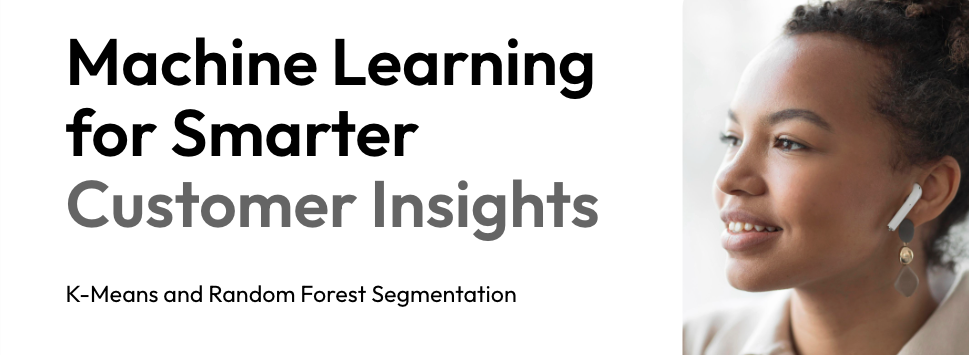

<h1>0 | Import Libraries</h1>

In [3]:
# ===================== Handling =====================
import pandas as pd
import numpy as np
from scipy.stats import zscore

# ===================== Visualization =====================
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# ===================== Preprocessing =====================
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# ===================== Dimensionality Reduction & Clustering =====================
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

# ===================== Train-Test Split & Model Selection =====================
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

# ===================== ML Models =====================
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

import xgboost as xgb 

# ===================== Evaluation Metrics =====================
from sklearn import tree, metrics
from sklearn.metrics import (
    accuracy_score, roc_auc_score, precision_score, recall_score, 
    average_precision_score, f1_score, fbeta_score, classification_report, 
    confusion_matrix
)

# ===================== Miscellaneous =====================
import pickle
import warnings
import joblib

warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)

# 1 | Load Data

In [5]:
def load_data(filepath):
    """Load dataset from CSV file"""
    return pd.read_csv(filepath)

df = load_data("raw_customer_data.csv")

# 2 | Explore Data

In [7]:
def explore_data(df):
    """Initial EDA"""
    print(df.info())
    display(df.head())
    print("\nSummary Statistics:")
    display(df.describe())
    print("\nMissing Values:")
    print(df.isnull().sum()/len(df)*100)
    print("\nDuplicated Values:")
    print(df.duplicated().sum())
    duplicates = df.duplicated().sum()
    percentage = df.duplicated().sum() / df.shape[0] * 100
    print(f'{duplicates} rows contain duplicates amounting to {percentage.round(2)}% of the total data.')
    print (f"\nShape: {df.shape}")
    
explore_data(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12



Summary Statistics:


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000



Missing Values:
CUST_ID                             0.000000
BALANCE                             0.000000
BALANCE_FREQUENCY                   0.000000
PURCHASES                           0.000000
ONEOFF_PURCHASES                    0.000000
INSTALLMENTS_PURCHASES              0.000000
CASH_ADVANCE                        0.000000
PURCHASES_FREQUENCY                 0.000000
ONEOFF_PURCHASES_FREQUENCY          0.000000
PURCHASES_INSTALLMENTS_FREQUENCY    0.000000
CASH_ADVANCE_FREQUENCY              0.000000
CASH_ADVANCE_TRX                    0.000000
PURCHASES_TRX                       0.000000
CREDIT_LIMIT                        0.011173
PAYMENTS                            0.000000
MINIMUM_PAYMENTS                    3.497207
PRC_FULL_PAYMENT                    0.000000
TENURE                              0.000000
dtype: float64

Duplicated Values:
0
0 rows contain duplicates amounting to 0.0% of the total data.

Shape: (8950, 18)


# 3 | Data Preprocessing

#### Drop Unnecessary

In [10]:
df = df.drop(columns = ["CUST_ID"], axis = 1)

#### Renaming and Ordering Columns

In [12]:
df.columns = df.columns.str.strip().str.lower().str.replace(" ", "_")

In [13]:
df.columns

Index(['balance', 'balance_frequency', 'purchases', 'oneoff_purchases',
       'installments_purchases', 'cash_advance', 'purchases_frequency',
       'oneoff_purchases_frequency', 'purchases_installments_frequency',
       'cash_advance_frequency', 'cash_advance_trx', 'purchases_trx',
       'credit_limit', 'payments', 'minimum_payments', 'prc_full_payment',
       'tenure'],
      dtype='object')

#### Nulls

In [15]:
df[['credit_limit', 'minimum_payments']] = df[['credit_limit', 'minimum_payments']].fillna(df[['credit_limit', 'minimum_payments']].mean())

#### No Duplicated

#### Outliers

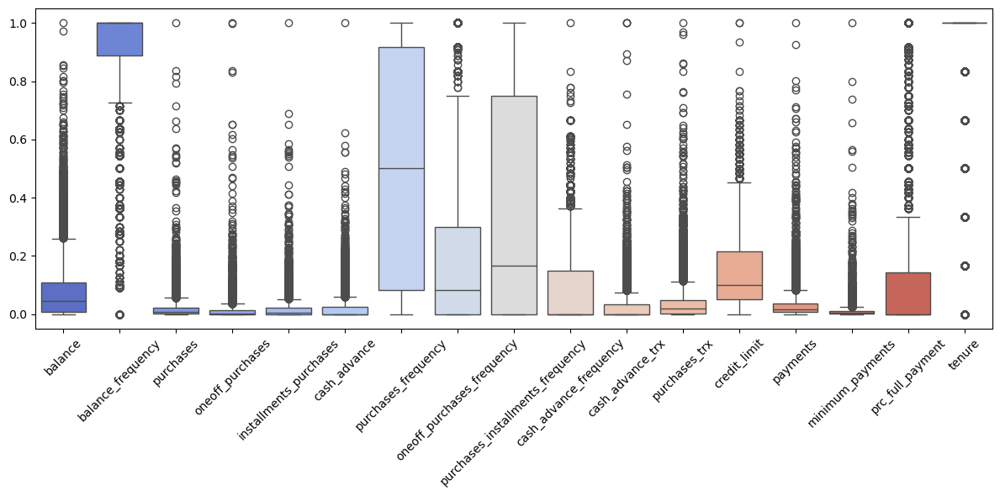

In [18]:
df_numeric = df.select_dtypes(include=['number'])
normalized_data = MinMaxScaler().fit_transform(df_numeric)
df_normalized = pd.DataFrame(normalized_data, columns=df_numeric.columns)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_normalized, palette="coolwarm")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('outliers.png', format='png', dpi=300)
plt.show()

In [19]:
# no assumption of normality, skewed distributions(non-Gaussian)
def outlier_percentage_iqr(df):   
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR)))
    return (outliers.sum() / len(df)) * 100 

outlier_percentages = outlier_percentage_iqr(df.select_dtypes(include=[np.number]))
print(outlier_percentages)

balance                              7.765363
balance_frequency                   16.681564
purchases                            9.027933
oneoff_purchases                    11.318436
installments_purchases               9.687151
cash_advance                        11.508380
purchases_frequency                  0.000000
oneoff_purchases_frequency           8.737430
purchases_installments_frequency     0.000000
cash_advance_frequency               5.865922
cash_advance_trx                     8.983240
purchases_trx                        8.558659
credit_limit                         2.770950
payments                             9.027933
minimum_payments                     8.648045
prc_full_payment                    16.469274
tenure                              15.262570
dtype: float64


In [20]:
# normally distributed (Gaussian) data
z_scores = df.select_dtypes(include=[np.number]).apply(zscore)
outliers_z = (z_scores.abs() > 3).sum() / len(df) * 100
print(outliers_z)

balance                             2.189944
balance_frequency                   1.966480
purchases                           1.508380
oneoff_purchases                    1.363128
installments_purchases              1.530726
cash_advance                        2.033520
purchases_frequency                 0.000000
oneoff_purchases_frequency          0.000000
purchases_installments_frequency    0.000000
cash_advance_frequency              2.223464
cash_advance_trx                    1.921788
purchases_trx                       2.067039
credit_limit                        1.698324
payments                            1.776536
minimum_payments                    1.139665
prc_full_payment                    0.000000
tenure                              4.402235
dtype: float64


IQR detects more outliers than Z-score, data is likely skewed or has extreme values.

#### Data Types

In [23]:
df.dtypes

balance                             float64
balance_frequency                   float64
purchases                           float64
oneoff_purchases                    float64
installments_purchases              float64
cash_advance                        float64
purchases_frequency                 float64
oneoff_purchases_frequency          float64
purchases_installments_frequency    float64
cash_advance_frequency              float64
cash_advance_trx                      int64
purchases_trx                         int64
credit_limit                        float64
payments                            float64
minimum_payments                    float64
prc_full_payment                    float64
tenure                                int64
dtype: object

# 4 | EDA

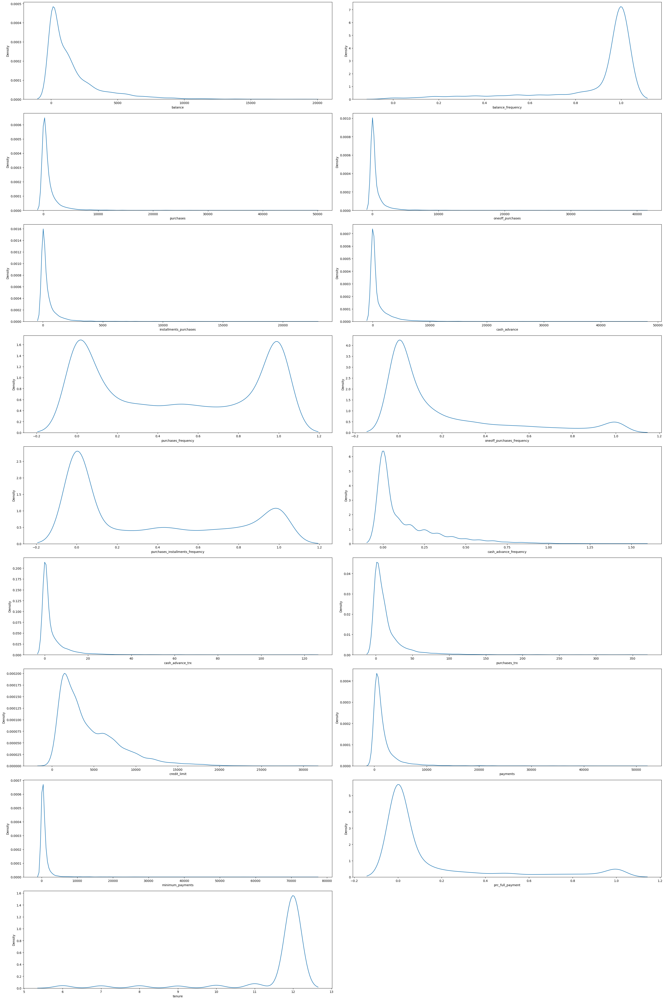

In [25]:
plt.figure(figsize=(30, 45))  
for i, col in enumerate(df.columns):
    ax = plt.subplot(9, 2, i+1)  
    sns.kdeplot(df[col], ax=ax, palette="coolwarm")  # KDE, alternative histplot
    ax.set_xlabel(col)        
plt.tight_layout()

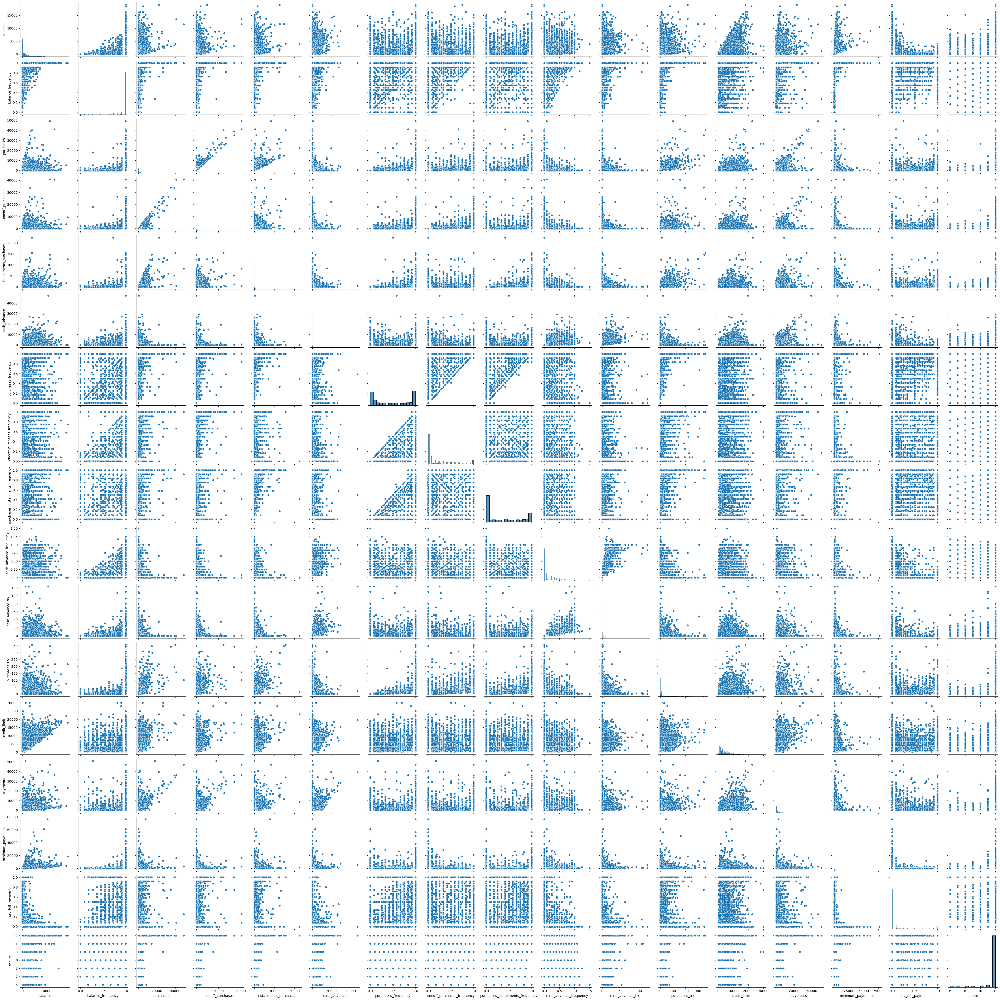

In [26]:
sns.pairplot(df, palette="coolwarm")
plt.show()

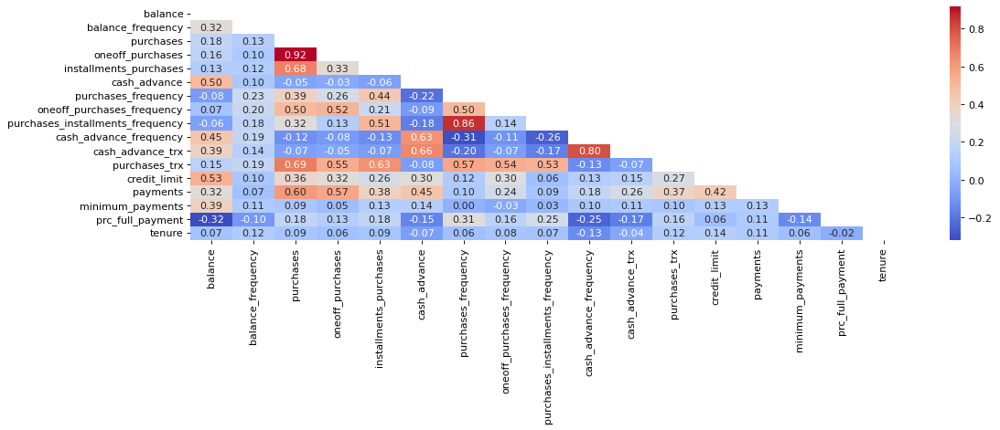

In [27]:
corr_matrix = df.corr()
mask = np.triu(np.ones_like(corr_matrix))
plt.figure(figsize=(15,6), dpi=80) 
sns.heatmap(corr_matrix, annot=True, mask=mask, fmt=".2f", cmap="coolwarm")
plt.tight_layout()
plt.savefig('corr_matrix.png', format='png', dpi=300)
plt.show()

#### Strong Positive Correlations
- Purchases and oneoff_purchases (0.92) → High correlation
- Purchases and purchases_trx (0.69) → The more transactions a person makes, the higher their total purchases.
- Cash_advance_frequency and cash_advance_trx (0.80) → The frequency of cash advances is highly correlated with the number of cash advance transactions.

#### Strong Negative Correlations
- Balance and prc_full_payment (-0.32) → People with high balances are less likely to pay their full balance.
- Cash_advance_frequency and purchases__frequency (-0.31) → Customers who frequently take cash advances tend to make fewer purchases.

#### Moderate Correlations
- Balance and credit_limit (0.53) → Higher credit limits tend to be associated with higher balances.
- Payments and Purchases (0.60) → More purchases mean higher payments.
- Installments_Purchases and purchases_trx (0.63) → More installment purchases relate to a higher number of transactions.

#### Possible Insights for Analysis
- Identifying Spending Behavior: Customers who make a lot of one-time purchases (oneoff_Purchases) tend to have higher overall spending (purchases).
- Credit Risk Analysis: Customers who do not pay their balance in full (prc_full_payment) might have higher balances (balance), indicating potential risk.
- Cash Advances vs. Purchases: Customers who frequently take cash advances (cash_advance_frequency) tend to make fewer purchases, which could indicate financial strain.

# 5 | Apply PCA (Dimensionality Reduction)

In [30]:
# scaling features as PCA works best when features are standardized and also K-Means is distance-based
scaler = StandardScaler()
scaled_df= scaler.fit_transform(df)

,PCA1,PCA2
0,-1.682220,-1.076451
1,-1.138295,2.506477
2,0.969684,-0.383520
3,-0.873628,0.043166
4,-1.599434,-0.688581
...,...,...
8945,-0.359629,-2.016145
8946,-0.564369,-1.639123
8947,-0.926204,-1.810786
8948,-2.336552,-0.657966



Explained variance per component: [0.27290037 0.20301991]
Total explained variance: 0.4759202855062019




,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,0.101077,0.120043,0.411642,0.346407,0.336814,-0.023343,0.321493,0.294633,0.274710,-0.089139,-0.048654,0.390695,0.211663,0.266249,0.060351,0.132112,0.081021
1,0.403957,0.130537,0.041038,0.062872,-0.018533,0.439242,-0.190780,-0.017924,-0.178601,0.434082,0.419734,-0.019394,0.238678,0.257476,0.166970,-0.190026,-0.004326


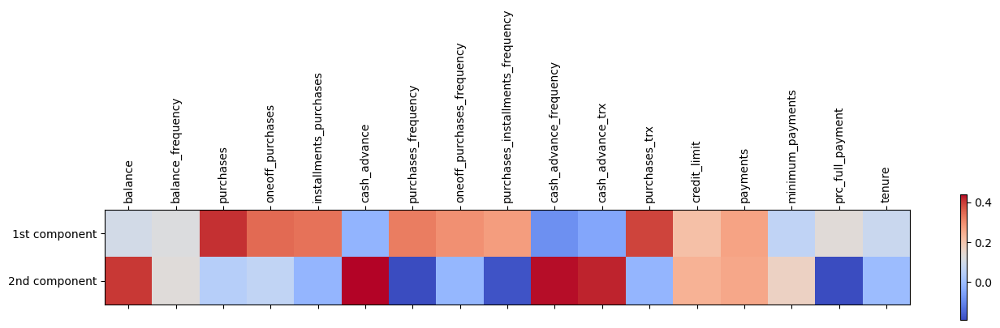

In [31]:
# applying PCA to capture the most variance with fewer dimensions (17D to 2D)  
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_df)

# dataframe with principal components
pca_df = pd.DataFrame(data=pca_data ,columns=["PCA1","PCA2"])
print("\n")
display(pca_df)

# variance ratio
print("\nExplained variance per component:", pca.explained_variance_ratio_)
print("Total explained variance:", sum(pca.explained_variance_ratio_))
print("\n")

# PCA components as rows and originalfeature names as column headers
display (pd.DataFrame(pca.components_, columns=df.columns))

plt.matshow(pca.components_, cmap='coolwarm')
plt.yticks([0, 1], ["1st component", "2nd component"])
plt.colorbar()
plt.xticks(range(len(df.columns)), df.columns, rotation=90)
plt.tight_layout()
plt.savefig('pca_heatmap.png', format='png', dpi=300, bbox_inches='tight')
plt.show()

# 6 | Elbow Method & Silhouette Scores to determine optimal K

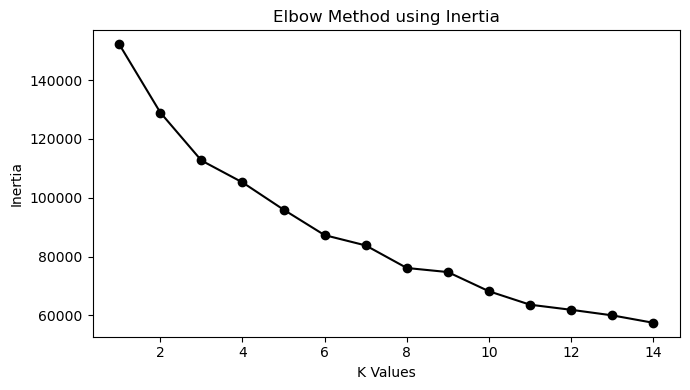

In [33]:
# run Elbow Method to plot the relationship between number of clusters (K) and inertia, identifying “elbow” (inertia decreasing at a slower rate) to choose the right number of clusters
inertia = []
range_val = range(1, 15)

for i in range_val:
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(scaled_df)
    inertia.append(kmeans.inertia_)
    
plt.figure(figsize=(7, 4))
plt.plot(range_val, inertia, 'k-o')
plt.xlabel('K Values')
plt.ylabel('Inertia')
plt.title('Elbow Method using Inertia')
plt.tight_layout()
plt.savefig('elbow.png', format='png', dpi=300)
plt.show()

In [34]:
# how well the data points are grouped
silhouette_scores = []
K_range = range(4, 10)  

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(df)
    score = silhouette_score(df, kmeans.labels_)
    silhouette_scores.append(score)
    print(f"k={k}, Silhouette Score: {score:.4f}")

best_k = K_range[silhouette_scores.index(max(silhouette_scores))]
print(f"Optimal k based on Silhouette Score: {best_k}")

k=4, Silhouette Score: 0.3981
k=5, Silhouette Score: 0.3418
k=6, Silhouette Score: 0.3513
k=7, Silhouette Score: 0.3902
k=8, Silhouette Score: 0.3812
k=9, Silhouette Score: 0.3846
Optimal k based on Silhouette Score: 4


# 7 |  Run K-Means Clustering with Optimal K

In [36]:
# apply K-Means with optimal K (assuming K=4 from elbow method) to cluster the PCA reduced data
kmeans = KMeans(n_clusters=4, random_state=42) 
kmeans_labels = kmeans.fit_predict(pca_df) 

# add cluster labels to both PCA and original df
pca_df["cluster"] = kmeans_labels
df["cluster"] = kmeans_labels

display(pca_df)
display(df)

,PCA1,PCA2,cluster
0,-1.682220,-1.076451,1
1,-1.138295,2.506477,0
2,0.969684,-0.383520,3
3,-0.873628,0.043166,1
4,-1.599434,-0.688581,1
...,...,...,...
8945,-0.359629,-2.016145,3
8946,-0.564369,-1.639123,3
8947,-0.926204,-1.810786,1
8948,-2.336552,-0.657966,1


,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,cluster
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,3
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,3
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6,3
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


# 8 |   Analyze & Visualize Clusters

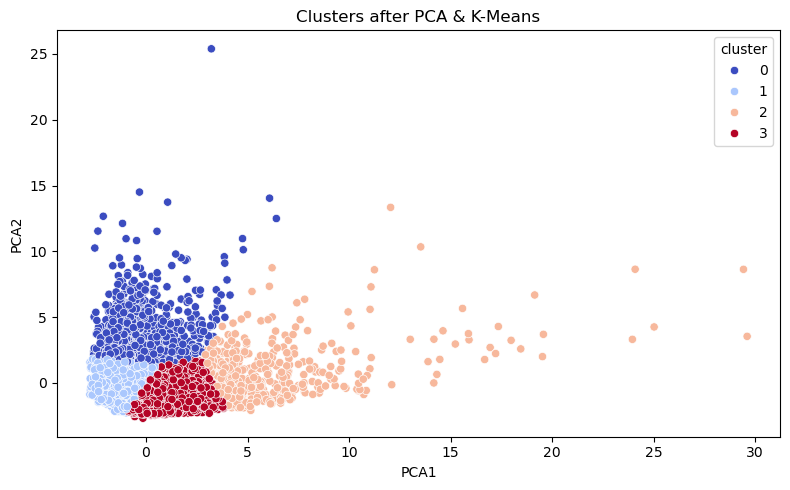

In [38]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x='PCA1', y='PCA2', hue='cluster', palette='coolwarm', data=pca_df)
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color='black', marker='X', s=50, label="Centroids")
plt.title("Clusters after PCA & K-Means")
plt.tight_layout()
plt.savefig('clusters.png', format='png', dpi=300)
plt.show()

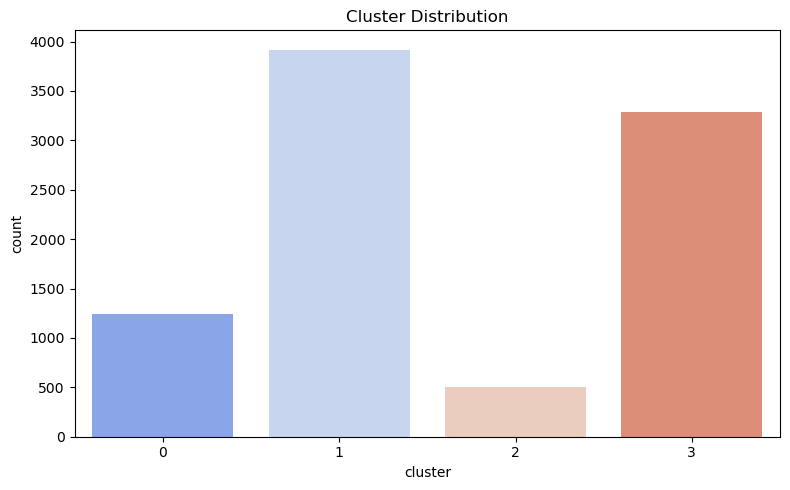

In [39]:
plt.figure(figsize=(8, 5))
sns.countplot(x='cluster', data=df, palette='coolwarm')
plt.title("Cluster Distribution")
plt.tight_layout()
plt.savefig('cluster_distribution.png', format='png', dpi=300)
plt.show()

In [40]:
cluster_means = df.groupby("cluster").mean()
cluster_means

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
cluster,,,,,,,,,,,,,,,,,
0,4508.592174,0.963457,462.914437,300.368650,162.645201,4403.476123,0.266204,0.129934,0.166120,0.471215,13.781350,6.705788,7456.595294,3545.166835,2060.654606,0.034975,11.438907
1,1014.708276,0.800024,222.981330,157.502591,65.807853,615.077919,0.190014,0.074880,0.109856,0.122481,2.264676,2.959673,3111.229654,856.205918,587.001414,0.065965,11.364216
2,3401.840056,0.988427,6894.613917,4511.889901,2383.916859,773.154467,0.954443,0.726667,0.808946,0.084806,2.363817,82.902584,9541.650099,6723.271522,1831.233832,0.288014,11.960239
3,823.929519,0.919745,1236.281903,621.637778,614.849145,147.397313,0.862380,0.301816,0.675113,0.030689,0.569559,21.313546,4249.640868,1328.776125,593.671862,0.282775,11.661796


---
---
<h4> <div class="alert alert-danger">
    
- **Cluster 0** may be risky due to heavy cash advances.
 
- **Cluster 1** is low engagement and might not generate much revenue.

- **Cluster 2** is the **most valuable segment** (high spenders, high credit limits).
 
- **Cluster 3** is installment-focused, a mix of good & cautious spenders.
</h4>

---
---
### **Cluster 0: High balance and cash advance usage, with moderate purchases**
---

- High balance (4509) and frequent cash advances (4403)
- Moderate spending (463) but prefers one-off purchases (300)
- Low purchase frequency (0.27) but high cash advance frequency (0.47)
- Very low full payment ratio (3.5%) → Likely relies on revolving credit
- Moderate credit limit (7457)

---

- **Possible Profile:**
    - Likely credit-dependent users who rely on cash advances
    - May struggle with payments or prefer using credit over their own money
      
---  

- **Strategy:**
	- Offer financial advisory or debt management plans.
	- Provide lower-interest credit offers to reduce risk.
	- Target with personalized payment options to ease cash flow.
      
---
---

### **Cluster 1: Low Balance, Low Spending, Low overall engagement and Low Risk**
---

- Lowest balance (1015) and low spending (223)
- Prefers one-off purchases (157) over installment purchases (66)
- Low cash advance usage (615)
- Low purchase frequency (0.19)
- Credit limit is low (3111), low payments (856)

---

- **Possible Profile:**
	- Casual credit card users who don’t rely heavily on credit
	- Likely low-income or budget-conscious customers
	- Potentially inactive or low-value customers for the bank

---

- **Strategy:**
	- Encourage increased spending through targeted offers or rewards.
	- Focus on retention campaigns to prevent churn.
	- Offer small credit increases to incentivize activity.
      
---
---

### **Cluster 2: High Balance, High Spenders, Frequent Use and Big Credit Limits**
---

- Moderate balance (3402) but extremely high purchases (6895)
- Loves one-off purchases (4512) and installment purchases (2384)
- Minimal cash advances (773) → Relies on credit for shopping, not cash
- Extremely high purchase frequency (0.95)
- Very high credit limit (9542) and high payments (6723)
- Highest full payment ratio (28.8%)

---

- **Possible Profile:**
	- High-value customers who spend a lot but pay on time
	- Likely premium customers with strong credit scores
	- Good for the bank as they generate high transaction volume
---
- **Strategy:**
	- Upsell premium services (exclusive credit cards, rewards programs).
	- Offer loyalty programs for continued engagement.
	- Provide personalized financial management tools.

---
---

### **Cluster 3: Moderate Balance, Moderate Spenders and Installment Heavy**
---

- Lowest balance (824) but moderate purchases (1236)
- Split spending evenly between one-off (622) and installment (615)
- Minimal cash advances (147)
- Fairly high purchase frequency (0.86) but lower one-off purchase frequency (0.30)
- Moderate credit limit (4250) and decent payments (1329)
- Moderate full payment ratio (28.3%)

---

- **Possible Profile:**
	- Customers who prefer installment payments over one-off large transactions
	- Likely middle-class consumers managing finances carefully
	- Potentially good long-term customers if nurtured well

---

- **Strategy:**
	- Promote long-term payment plans and low-interest installment options.
	- Offer specialized installment payment products.
	- Provide loyalty benefits for recurring purchases.
 ---
 ---

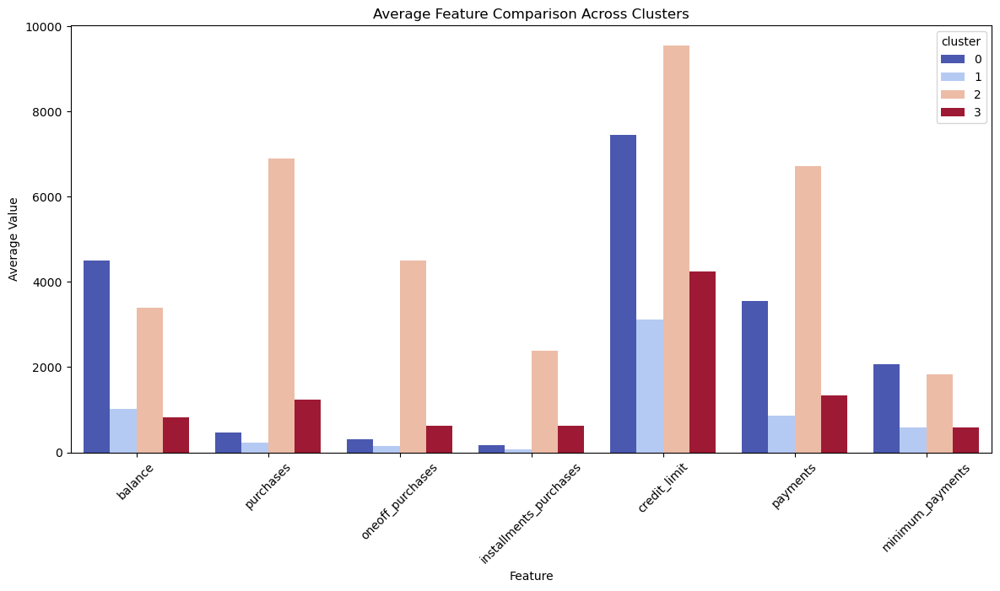

In [43]:
cluster_means_reset = df[['balance',
 'purchases',
 'oneoff_purchases',
 'installments_purchases',
 'credit_limit',
 'payments',
 'minimum_payments', 'cluster']].reset_index(drop=True)
melted_df = cluster_means_reset.melt(id_vars='cluster', var_name='Feature', value_name='Average Value')
plt.figure(figsize=(12, 6))
sns.barplot(data=melted_df, x='Feature', y='Average Value', hue='cluster', palette='coolwarm', ci=None)
plt.title('Average Feature Comparison Across Clusters')
plt.ylabel('Average Value')
plt.tight_layout()
plt.savefig('cluster_feature_comparison.png', format='png', dpi=300)
plt.xticks(rotation=45)
plt.show()

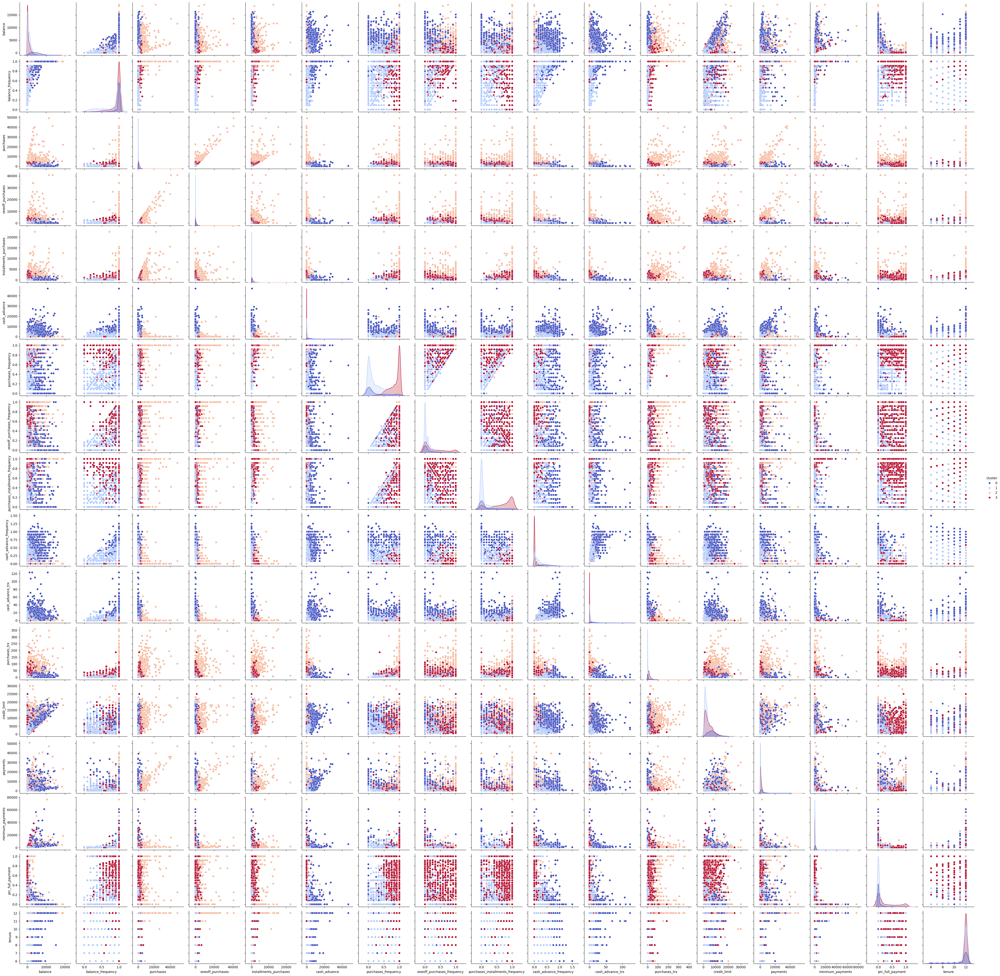

In [44]:
# feature Relationships to detect patterns and whether clustering can capture natural groups
sns.pairplot(df, hue="cluster", palette="coolwarm")
plt.show()

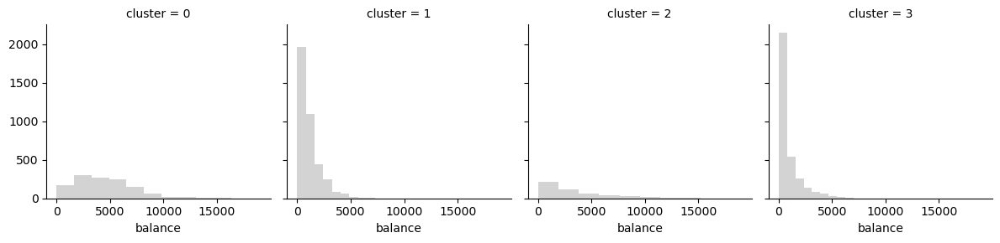

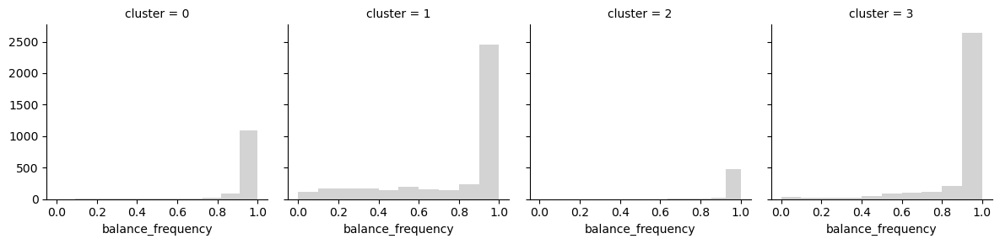

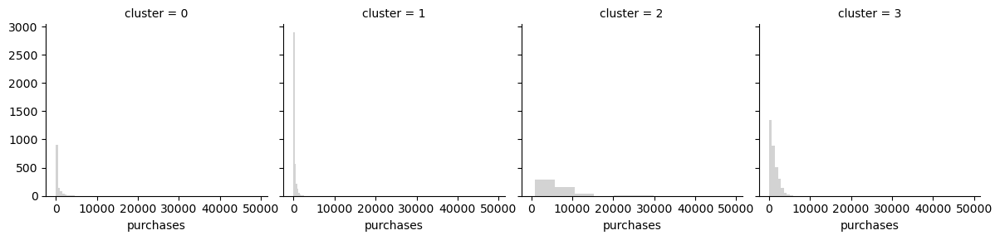

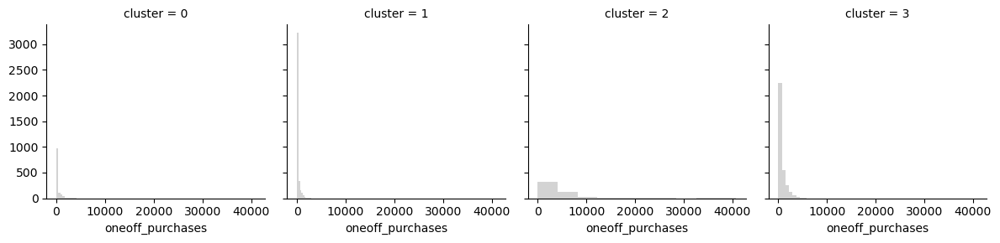

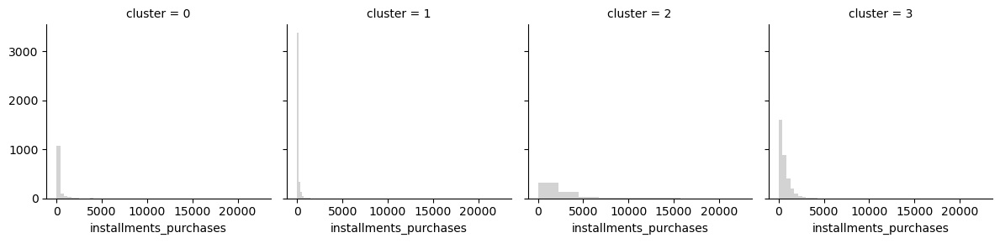

...

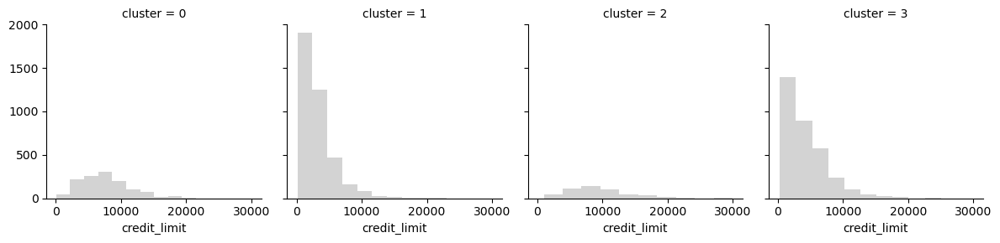

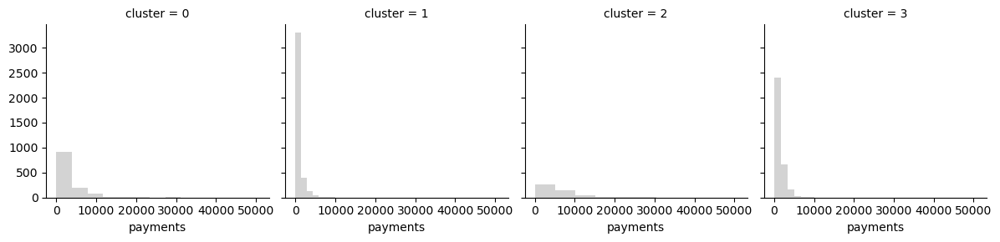

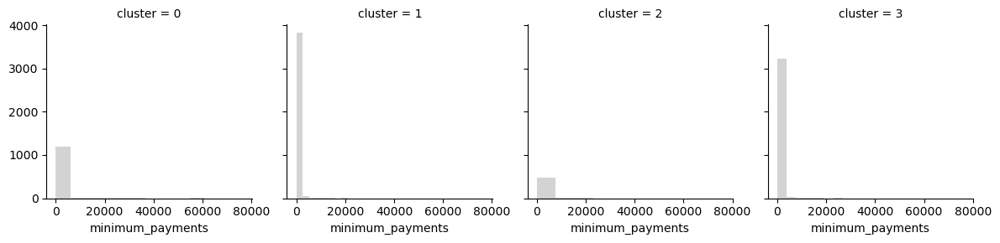

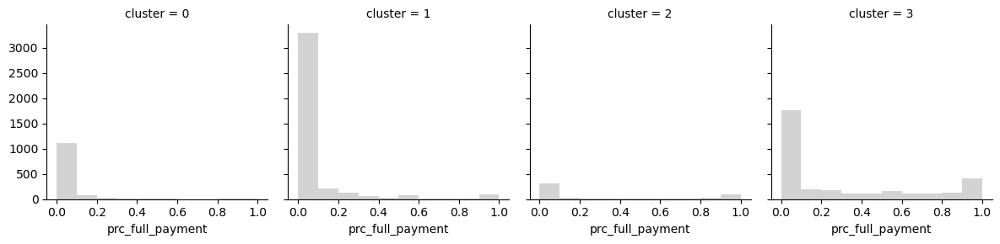

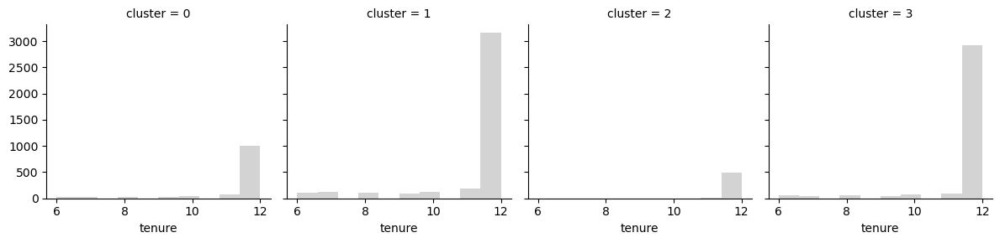

In [45]:
# distribution of the 4 clusters
for c in df.drop(['cluster'],axis=1):
    grid= sns.FacetGrid(df, col='cluster', palette='coolwarm')
    grid= grid.map(plt.hist, c, color="lightgrey")
plt.show()

# 9 | Save K-Means Model

In [47]:
joblib.dump(kmeans, "kmeans.pkl")
df.to_csv("clustered_customer_data.csv")

# 10 | Unsupervised to Supervised (4 classes)

In [49]:
X = df.drop(columns=["cluster"])
y = df["cluster"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [50]:
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "SVM": SVC(),
    "KNN": KNeighborsClassifier(),
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Naive Bayes": GaussianNB(),   
}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {acc:.4f}")
    print(classification_report(y_test, y_pred))
    print("-" * 53)

Random Forest Accuracy: 0.9514
              precision    recall  f1-score   support

           0       0.91      0.92      0.92       238
           1       0.96      0.97      0.97       787
           2       0.94      0.81      0.87       107
           3       0.95      0.96      0.96       658

    accuracy                           0.95      1790
   macro avg       0.94      0.92      0.93      1790
weighted avg       0.95      0.95      0.95      1790

-----------------------------------------------------
Decision Tree Accuracy: 0.9307
              precision    recall  f1-score   support

           0       0.86      0.87      0.87       238
           1       0.95      0.95      0.95       787
           2       0.87      0.84      0.86       107
           3       0.94      0.94      0.94       658

    accuracy                           0.93      1790
   macro avg       0.91      0.90      0.90      1790
weighted avg       0.93      0.93      0.93      1790

--------------

- **Random Forest** is the best performer with the highest accuracy (94.75%) and balanced precision/recall.

- **Logistic Regression** performed surprisingly well as a simpler model but still reached 91.96%.accuracy.

- **Decision Tree** is close (90.67%) but RF naturally does better.

- **Naïve Bayes** is good but struggles with some classes.

- **SVM** & **KNN** are lower in accuracy.

## **Fine-Tuning**

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Tuned Random Forest Accuracy: 0.9513966480446927
              precision    recall  f1-score   support

           0       0.91      0.92      0.92       238
           1       0.96      0.97      0.97       787
           2       0.94      0.81      0.87       107
           3       0.95      0.96      0.96       658

    accuracy                           0.95      1790
   macro avg       0.94      0.92      0.93      1790
weighted avg       0.95      0.95      0.95      1790

                             Feature  Importance
6                purchases_frequency    0.171435
11                     purchases_trx    0.129533
2                          purchases    0.097750
5                       cash_advance    0.082685
10                  cash_advance_trx    0.074884
0                            balance    0.068368
8   pu

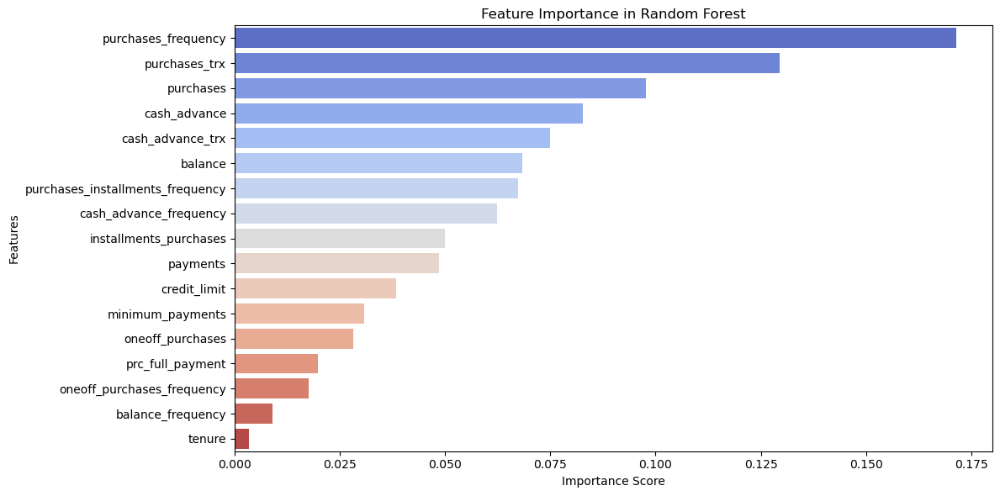

In [53]:
param_grid = {
    'n_estimators': [50, 100, 200],      
    'max_depth': [10, 20, None],         
    'min_samples_split': [2, 5, 10],     
    'min_samples_leaf': [1, 2, 4]    
}

rf = RandomForestClassifier(random_state=42)

grid_search = GridSearchCV(rf, param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
print("Best Parameters:", best_params)

best_rf = RandomForestClassifier(**best_params, random_state=42)
best_rf.fit(X_train, y_train)

y_pred = best_rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Tuned Random Forest Accuracy:", accuracy)

print(classification_report(y_test, y_pred))

feature_importances = best_rf.feature_importances_

importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print(importance_df)

plt.figure(figsize=(12, 6))
sns.barplot(x=importance_df['Importance'], y=importance_df['Feature'], palette="coolwarm")
plt.title("Feature Importance in Random Forest")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.savefig('rf_feature_importance.png', format='png', dpi=300)
plt.show()

# 11 | Save RF Model for Predictions

In [55]:
# fitting on full data before deployment to ensure max learning
rf = best_rf
rf.fit(X, y)

RandomForestClassifier(random_state=42)

In [56]:
with open('rf.pkl', 'wb') as f:
    pickle.dump(rf, f)

# 12 | Next Steps: Model Deployment

In [ ]:
with open('rf.pkl', 'rb') as f:
    rf = pickle.load(f)

In [ ]:
new_data = pd.read_csv('path_to_new_data.csv')
predictions = rf.predict(new_data)